In [1]:
using DifferentialEquations
using Plots
using Statistics
using FFTW
FFTW.set_provider!("mkl")
#import Pkg; Pkg.add("Distributions")
using Distributions


In [14]:
include("aux_functions.jl")

get_index_and_distance (generic function with 1 method)

### Parameters

    L;            // Domain of solution 0 <= x <= L (in Debye lengths)
    N;            // Number of electrons
    J;            // Number of grid points
    vb;    // Beam velocity
    dt;    // Time-step (in inverse plasma frequencies)
    t_f;  // Simulation run from t = 0. to t = t_f


In [15]:

L = 100
#N = 200000
N = 20000
#J = 2048
J = 1024
vb = 3
dt = 0.1
t_f = 10.0
t = 0.0
M = convert(Int64,t_f/dt)
#M=1
κ = 2π/L
dx = L/J
x = [dx*(i-1) for i in 1:J];


p = (L, N, J, κ, dx)


(100, 20000, 1024, 0.06283185307179587, 0.09765625)

### Produce the intial data

The 1D distribution for $\frac{m}{kT} = 1$ is just the normal distribution centered at both $\pm v_p$. With $\sigma = 1$.


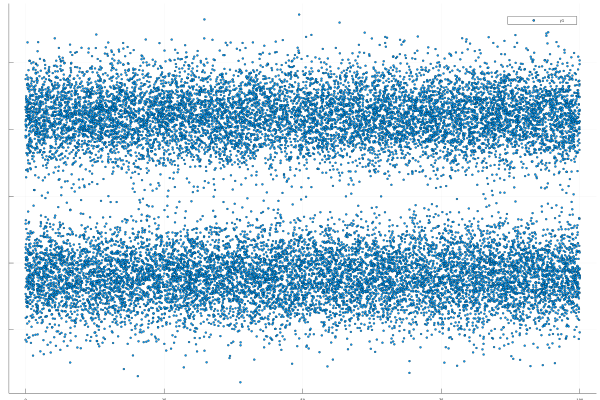

In [11]:

r = L*rand(N)
v = [rand(Normal(-vb,1),N÷2); rand(Normal(vb,1),N÷2)]
u = [r;v];

Coordinate_test(r,L)

plt = scatter(r,v, thickness_scaling = 0.3)
#png("t00_1024_2_4")

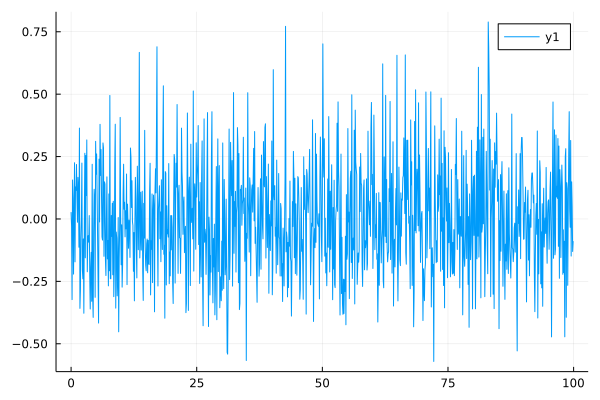

In [6]:
E = zeros(J)
ϕ = zeros(J)
n = zeros(J)
du = zeros(2*N)

p_RHS = N, J, L, dx, n, E, ϕ, du, Density!, Electric!, Poisson1D! ;

Density!(r,n,dx)
plot(x,n*L/N .- 1)

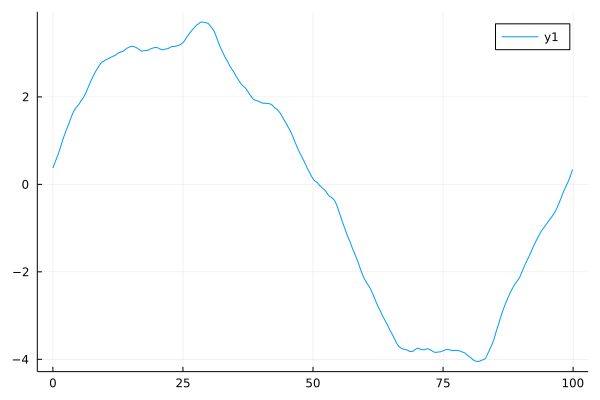

In [7]:
Poisson1D!(ϕ, n*L/N .- 1, κ)
plot(x,ϕ)

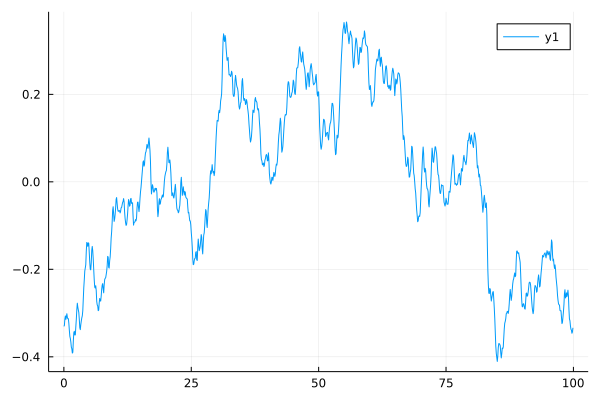

In [8]:
Electric!(ϕ, E, dx)
plot(x,E)

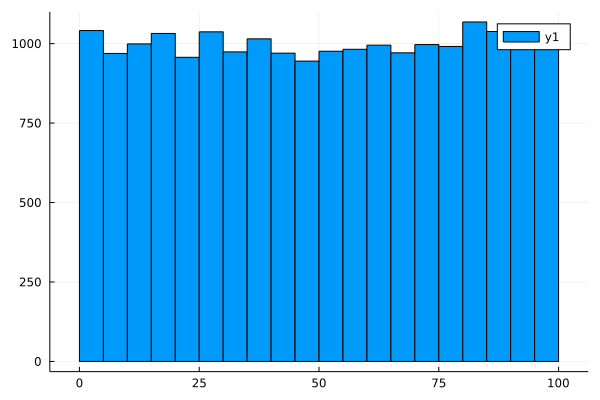

In [12]:
histogram(u[1:N])

In [16]:

for k in 1:M
  
  
  RK4_Step!(RHS,u,t,dt,p_RHS)
  u = [make_periodic!(u[1:N],L); u[N+1:end]]
  

  if k % (M÷10) == 0
    #scatter(plt, u[1:N], u[N+1:2*N])
  end
  t = t + dt

end
  

  

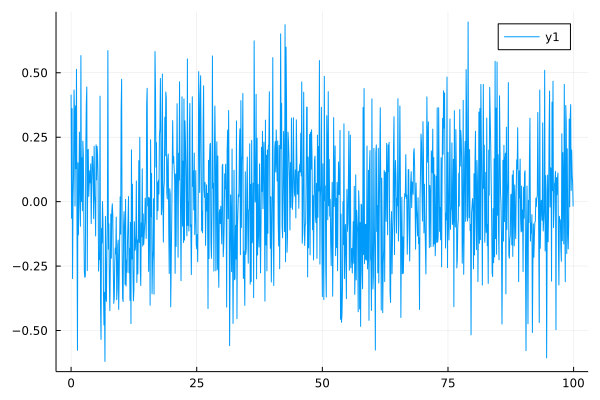

In [17]:
plot(x,n*L/N .- 1)

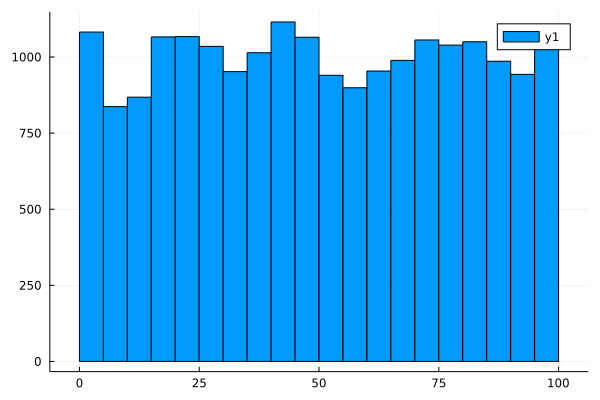

In [18]:
histogram(u[1:N])

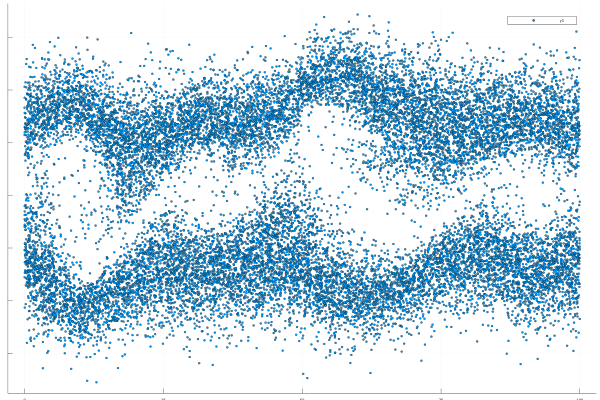

In [20]:
scatter(u[1:N],u[N+1:end], thickness_scaling = 0.3)
#png("t10_1024_2_4")